Датасет Ultrasound Nerve Segmentation был взят c Kaggle соревнований https://www.kaggle.com/c/ultrasound-nerve-segmentation/data

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!unzip -q /content/drive/My\ Drive/ultrasound-nerve-segmentation/ultrasound-nerve-segmentation.zip

Загружаем аннотации из формата .csv

In [0]:
import pandas as pd
table0=pd.read_csv('/content/train_masks.csv', sep=(','))
table0.head(1100)


,subject,img,pixels
0,1,1,168153 9 168570 15 168984 22 169401 26 169818 ...
1,1,2,96346 7 96762 16 97179 27 97595 35 98012 40 98...
2,1,3,121957 2 122365 26 122784 28 123202 31 123618 ...
3,1,4,110980 9 111393 21 111810 33 112228 43 112647 ...
4,1,5,NaN
...,...,...,...
1095,10,18,98876 13 99291 19 99711 21 100129 24 100549 24...
1096,10,19,NaN
1097,10,20,NaN
1098,10,21,NaN


In [0]:



import os
import cv2
from google.colab.patches import cv2_imshow
import json
import pandas as pd
from math import isnan
import numpy as np
from PIL import Image
from collections import OrderedDict
#from split_coco_datasets.pycocotools.coco import COCO
import copy
from pycocotools import mask as cocomask



In [0]:
table0.shape

(5635, 3)

Сделаем еще одну таблицу без NaN-ов, только с данными, где есть сегментация:

In [0]:
from copy import deepcopy
#table1=pd.Series(['subject', 'img', 'pixels'])
table1=deepcopy(table0[table0.pixels.isna()==0])
#for i in range(table1.shape[0]):
  #if table1['pixels'][i]!='NaN':
    #table1.append(table['subject'][i],table['img'][i],table['pixels'][i])
table1.to_csv('/content/train_clean.csv')

table1 = pd.read_csv('/content/train_clean.csv')
table1

,Unnamed: 0,subject,img,pixels
0,0,1,1,168153 9 168570 15 168984 22 169401 26 169818 ...
1,1,1,2,96346 7 96762 16 97179 27 97595 35 98012 40 98...
2,2,1,3,121957 2 122365 26 122784 28 123202 31 123618 ...
3,3,1,4,110980 9 111393 21 111810 33 112228 43 112647 ...
4,6,1,7,172767 15 173175 29 173591 34 173993 7 174004 ...
...,...,...,...,...
2318,5590,47,76,130008 11 130417 31 130836 34 131247 47 131663...
2319,5599,47,85,129203 7 129614 18 130024 29 130435 39 130845 ...
2320,5605,47,91,129127 61 129542 75 129956 84 130373 91 130792...
2321,5622,47,108,124987 13 125403 24 125821 27 126235 36 126650...


Делаем COCO-format .json файл аннотаций:

In [0]:

info = {"year" : 2018,
        "version" : "1.0",
        "description" : "Ultrasound Nerve Segmentation",
        "contributor" : "Anna Shtangey",
        "url" : "annashtangey.pythonanywhere.com",
        "date_created" : "2020"
                    }
licenses = [{"id": 1,"name": "Attribution-NonCommercial", "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/"}]
type = "instances"

#Пробуем вытащить данные из таблицы:
masks = []
categories = []
names = []
bboxes=[]
areas=[]
annotations=[]
images = []
for i in range(table1.shape[0]-201):
  
 
  
  categories.append(int(table1['subject'][i]))  
  
  names.append(str(table1['img'][i]))
  
  #image_path = os.path.join('/content/train', str(categories[i])+"_"+str(names[i])+".tif")



#Пробуем вытащить данные из картинки:

  img= np.array(Image.open(os.path.join('/content/train', str(categories[i])+"_"+str(names[i])+".tif")).convert('RGB'))
  msk = np.array(Image.open(os.path.join('/content/train', str(categories[i])+"_"+str(names[i])+"_mask.tif")).convert('L'))
  #cv2_imshow(msk)
     
 
    
  contours, _ = cv2.findContours(msk, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

  segmentation = []
  for contour in contours:
            # Valid polygons have >= 6 coordinates (3 points)
    if contour.size >= 6:
        segmentation.append(contour.flatten().tolist())
        #print(segmentation)
  try:
    RLEs = cotcomask.frPyObjects(segmentation, msk.shape[0], msk.shape[1])
    RLE = cocomask.merge(RLEs)
  # RLE = cocomask.encode(np.asfortranarray(mask))
    #print(RLE)
    area = float(cocomask.area(RLE))
    print(area)
  except:
    area =[]
  [x, y, w, h] = cv2.boundingRect(msk)     
  bbox1 =[float(x), float(y), float(w), float(h)]
    #print(contour.flatten().tolist())
    #print(RLE)
  print(bbox1)
   
  areas.append(area)
  #print (msk)
  
  for s in range(len(segmentation[0])-1):
    segmentation[0][s]=float(segmentation[0][s])
  print(segmentation)
  annotations.append({"segmentation" : segmentation,
                                "area" : areas[i],
                                "iscrowd" : 0,
                                "image_id" : int(str(categories[i])+'000'+str(names[i])),
                                "bbox" : bbox1,
                                "category_id" :  categories[i],
                                "id": int(str(categories[i])+'000'+str(names[i]))})
  images.append({"date_captured" : "2020",
                           "file_name" : str(categories[i])+"_"+str(names[i])+".tif", # remove "/"
                           "id" : int(str(categories[i])+'000'+str(names[i])),
                           "license" : 1,
                           "url" : "",
                           "height" : msk.shape[0],
                           "width" : msk.shape[1]})

CATEGORIESS = [
    {
        'id': 1,
        'name': '1',
        'supercategory': 'shape',
    },
    {
        'id': 2,
        'name': '2',
        'supercategory': 'shape',
    },
    {
        'id': 3,
        'name': '3',
        'supercategory': 'shape',
    },
      {
        'id': 4,
        'name': '4',
        'supercategory': 'shape',
    },
    {
        'id': 5,
        'name': '5',
        'supercategory': 'shape',
    },
    {
        'id': 6,
        'name': '6',
        'supercategory': 'shape',
    },
      {
        'id': 7,
        'name': '7',
        'supercategory': 'shape',
    },
    {
        'id': 8,
        'name': '8',
        'supercategory': 'shape',
    },
    {
        'id': 9,
        'name': '9',
        'supercategory': 'shape',
    },
      {
        'id': 10,
        'name': '10',
        'supercategory': 'shape',
    },
    {
        'id': 11,
        'name': '11',
        'supercategory': 'shape',
    },
    {
        'id': 12,
        'name': '12',
        'supercategory': 'shape',
    },
    {
        'id': 13,
        'name': '13',
        'supercategory': 'shape',
    },
    {
        'id': 14,
        'name': '14',
        'supercategory': 'shape',
    },
    {
        'id': 15,
        'name': '15',
        'supercategory': 'shape',
    },
      {
        'id': 16,
        'name': '16',
        'supercategory': 'shape',
    },
    {
        'id': 17,
        'name': '17',
        'supercategory': 'shape',
    },
    {
        'id': 18,
        'name': '18',
        'supercategory': 'shape',
    },
      {
        'id': 19,
        'name': '19',
        'supercategory': 'shape',
    },
    {
        'id': 20,
        'name': '20',
        'supercategory': 'shape',
    },
    {
        'id': 21,
        'name': '21',
        'supercategory': 'shape',
    },
      {
        'id': 22,
        'name': '22',
        'supercategory': 'shape',
    },
    
    {
        'id': 23,
        'name': '23',
        'supercategory': 'shape',
    },
    {
        'id': 24,
        'name': '24',
        'supercategory': 'shape',
    },
    {
        'id': 25,
        'name': '25',
        'supercategory': 'shape',
    },
    {
        'id': 26,
        'name': '26',
        'supercategory': 'shape',
    },
      {
        'id': 27,
        'name': '27',
        'supercategory': 'shape',
    },
    {
        'id': 28,
        'name': '28',
        'supercategory': 'shape',
    },
    {
        'id': 29,
        'name': '29',
        'supercategory': 'shape',
    },
      {
        'id': 30,
        'name': '30',
        'supercategory': 'shape',
    },
    {
        'id': 31,
        'name': '31',
        'supercategory': 'shape',
    },
    {
        'id': 32,
        'name': '32',
        'supercategory': 'shape',
    },
      {
        'id': 33,
        'name': '33',
        'supercategory': 'shape',
    },
    {
        'id': 34,
        'name': '34',
        'supercategory': 'shape',
    },
    {
        'id': 35,
        'name': '35',
        'supercategory': 'shape',
    },
    {
        'id': 36,
        'name': '36',
        'supercategory': 'shape',
    },
    {
        'id': 37,
        'name': '37',
        'supercategory': 'shape',
    },
    {
        'id': 38,
        'name': '38',
        'supercategory': 'shape',
    },
      {
        'id': 39,
        'name': '39',
        'supercategory': 'shape',
    },
    {
        'id': 40,
        'name': '40',
        'supercategory': 'shape',
    },
    {
        'id': 41,
        'name': '41',
        'supercategory': 'shape',
    },
      {
        'id': 42,
        'name': '42',
        'supercategory': 'shape',
    },
    {
        'id': 43,
        'name': '43',
        'supercategory': 'shape',
    },
    {
        'id': 44,
        'name': '44',
        'supercategory': 'shape',
    },
      {
        'id': 45,
        'name': '45',
        'supercategory': 'shape',
    },
    {
        'id': 46,
        'name': '46',
        'supercategory': 'shape',
    },
    {
        'id': 47,
        'name': '47',
        'supercategory': 'shape',
    },
]

coco_output = {
        "info": info,
        "licenses": licenses ,
        "categories": CATEGORIESS,
        "images": [],
        "annotations": []
    }


for im_id in images:

    coco_output["images"].append(im_id)
    
for annotation_id in annotations:
        
    coco_output["annotations"].append(annotation_id)

with open('/content/annotation_train.json', 'w') as output_json_file:
  json.dump(coco_output, output_json_file)
  

[400.0, 84.0, 83.0, 87.0]
[[433.0, 84.0, 433.0, 85.0, 434.0, 86.0, 434.0, 88.0, 433.0, 89.0, 433.0, 90.0, 430.0, 93.0, 430.0, 94.0, 427.0, 97.0, 427.0, 98.0, 425.0, 100.0, 425.0, 101.0, 419.0, 107.0, 419.0, 108.0, 418.0, 109.0, 418.0, 110.0, 417.0, 111.0, 417.0, 112.0, 416.0, 113.0, 416.0, 114.0, 412.0, 118.0, 412.0, 120.0, 411.0, 121.0, 411.0, 123.0, 410.0, 124.0, 410.0, 125.0, 409.0, 126.0, 409.0, 127.0, 408.0, 128.0, 408.0, 130.0, 407.0, 131.0, 407.0, 132.0, 406.0, 133.0, 406.0, 134.0, 405.0, 135.0, 405.0, 136.0, 404.0, 137.0, 404.0, 139.0, 403.0, 140.0, 403.0, 142.0, 402.0, 143.0, 402.0, 148.0, 401.0, 149.0, 401.0, 151.0, 400.0, 152.0, 400.0, 160.0, 401.0, 161.0, 401.0, 163.0, 405.0, 167.0, 405.0, 168.0, 406.0, 168.0, 407.0, 169.0, 410.0, 169.0, 411.0, 170.0, 421.0, 170.0, 422.0, 169.0, 423.0, 169.0, 424.0, 168.0, 426.0, 168.0, 429.0, 165.0, 430.0, 165.0, 432.0, 163.0, 433.0, 163.0, 434.0, 162.0, 435.0, 162.0, 436.0, 161.0, 437.0, 161.0, 440.0, 158.0, 441.0, 158.0, 445.0, 154.0, 44

In [0]:
info = {"year" : 2018,
        "version" : "1.0",
        "description" : "Ultrasound Nerve Segmentation",
        "contributor" : "Anna Shtangey",
        "url" : "annashtangey.pythonanywhere.com",
        "date_created" : "2020"
                    }
licenses = [{"id": 1,"name": "Attribution-NonCommercial", "url": "http://creativecommons.org/licenses/by-nc-sa/2.0/"}]
type = "instances"

#Пробуем вытащить данные из таблицы:
masks = []
categories = []
names = []
bboxes=[]
areas=[]
annotations=[]
images = []
i=0
for k in range(table1.shape[0]-200,table1.shape[0]-1):
   
  
  categories.append(int(table1['subject'][i]))  
  
  names.append(str(table1['img'][i]))
  
  

  
#Пробуем вытащить данные из картинки:
  print(i)
  img= np.array(Image.open(os.path.join('/content/train', str(categories[i])+"_"+str(names[i])+".tif")).convert('RGB'))
  msk = np.array(Image.open(os.path.join('/content/train', str(categories[i])+"_"+str(names[i])+"_mask.tif")).convert('L'))
  #cv2_imshow(msk)
     
 
    
  contours, _ = cv2.findContours(msk, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

  segmentation = []
  for contour in contours:
            # Valid polygons have >= 6 coordinates (3 points)
    if contour.size >= 6:
        segmentation.append(contour.flatten().tolist())
        #print(segmentation)
  try:
    RLEs = cotcomask.frPyObjects(segmentation, msk.shape[0], msk.shape[1])
    RLE = cocomask.merge(RLEs)
  # RLE = cocomask.encode(np.asfortranarray(mask))
    #print(RLE)
    area = float(cocomask.area(RLE))
    print(area)
  except:
    area =[]
  [x, y, w, h] = cv2.boundingRect(msk)     
  bbox1 =[float(x), float(y), float(w), float(h)]
    #print(contour.flatten().tolist())
    #print(RLE)
  print(bbox1)
   
  areas.append(area)
  #print (msk)
  for s in range(len(segmentation[0])-1):
    segmentation[0][s]=float(segmentation[0][s])

  annotations.append({"segmentation" : segmentation,
                                "area" : areas[i],
                                "iscrowd" : 0,
                                "image_id" : int(str(categories[i])+'000'+str(names[i])),
                                "bbox" : bbox1,
                                "category_id" :  categories[i],
                                "id": int(str(categories[i])+'000'+str(names[i]))})
  images.append({"date_captured" : "2020",
                           "file_name" : str(categories[i])+"_"+str(names[i])+".tif", # remove "/"
                           "id" : int(str(categories[i])+'000'+str(names[i])),
                           "license" : 1,
                           "url" : "",
                           "height" : float(msk.shape[0]),
                           "width" : float(msk.shape[1])})
  i+=1
CATEGORIESS = [
    {
        'id': 1,
        'name': '1',
        'supercategory': 'shape',
    },
    {
        'id': 2,
        'name': '2',
        'supercategory': 'shape',
    },
    {
        'id': 3,
        'name': '3',
        'supercategory': 'shape',
    },
      {
        'id': 4,
        'name': '4',
        'supercategory': 'shape',
    },
    {
        'id': 5,
        'name': '5',
        'supercategory': 'shape',
    },
    {
        'id': 6,
        'name': '6',
        'supercategory': 'shape',
    },
      {
        'id': 7,
        'name': '7',
        'supercategory': 'shape',
    },
    {
        'id': 8,
        'name': '8',
        'supercategory': 'shape',
    },
    {
        'id': 9,
        'name': '9',
        'supercategory': 'shape',
    },
      {
        'id': 10,
        'name': '10',
        'supercategory': 'shape',
    },
    {
        'id': 11,
        'name': '11',
        'supercategory': 'shape',
    },
    {
        'id': 12,
        'name': '12',
        'supercategory': 'shape',
    },
    {
        'id': 13,
        'name': '13',
        'supercategory': 'shape',
    },
    {
        'id': 14,
        'name': '14',
        'supercategory': 'shape',
    },
    {
        'id': 15,
        'name': '15',
        'supercategory': 'shape',
    },
      {
        'id': 16,
        'name': '16',
        'supercategory': 'shape',
    },
    {
        'id': 17,
        'name': '17',
        'supercategory': 'shape',
    },
    {
        'id': 18,
        'name': '18',
        'supercategory': 'shape',
    },
      {
        'id': 19,
        'name': '19',
        'supercategory': 'shape',
    },
    {
        'id': 20,
        'name': '20',
        'supercategory': 'shape',
    },
    {
        'id': 21,
        'name': '21',
        'supercategory': 'shape',
    },
      {
        'id': 22,
        'name': '22',
        'supercategory': 'shape',
    },
    
    {
        'id': 23,
        'name': '23',
        'supercategory': 'shape',
    },
    {
        'id': 24,
        'name': '24',
        'supercategory': 'shape',
    },
    {
        'id': 25,
        'name': '25',
        'supercategory': 'shape',
    },
    {
        'id': 26,
        'name': '26',
        'supercategory': 'shape',
    },
      {
        'id': 27,
        'name': '27',
        'supercategory': 'shape',
    },
    {
        'id': 28,
        'name': '28',
        'supercategory': 'shape',
    },
    {
        'id': 29,
        'name': '29',
        'supercategory': 'shape',
    },
      {
        'id': 30,
        'name': '30',
        'supercategory': 'shape',
    },
    {
        'id': 31,
        'name': '31',
        'supercategory': 'shape',
    },
    {
        'id': 32,
        'name': '32',
        'supercategory': 'shape',
    },
      {
        'id': 33,
        'name': '33',
        'supercategory': 'shape',
    },
    {
        'id': 34,
        'name': '34',
        'supercategory': 'shape',
    },
    {
        'id': 35,
        'name': '35',
        'supercategory': 'shape',
    },
    {
        'id': 36,
        'name': '36',
        'supercategory': 'shape',
    },
    {
        'id': 37,
        'name': '37',
        'supercategory': 'shape',
    },
    {
        'id': 38,
        'name': '38',
        'supercategory': 'shape',
    },
      {
        'id': 39,
        'name': '39',
        'supercategory': 'shape',
    },
    {
        'id': 40,
        'name': '40',
        'supercategory': 'shape',
    },
    {
        'id': 41,
        'name': '41',
        'supercategory': 'shape',
    },
      {
        'id': 42,
        'name': '42',
        'supercategory': 'shape',
    },
    {
        'id': 43,
        'name': '43',
        'supercategory': 'shape',
    },
    {
        'id': 44,
        'name': '44',
        'supercategory': 'shape',
    },
      {
        'id': 45,
        'name': '45',
        'supercategory': 'shape',
    },
    {
        'id': 46,
        'name': '46',
        'supercategory': 'shape',
    },
    {
        'id': 47,
        'name': '47',
        'supercategory': 'shape',
    },
]

coco_output = {
        "info": info,
        "licenses": licenses ,
        "categories": CATEGORIESS,
        "images": [],
        "annotations": []
    }


for im_id in images:

    coco_output["images"].append(im_id)
    
for annotation_id in annotations:
        
    coco_output["annotations"].append(annotation_id)

with open('/content/annotation_test.json', 'w') as output_json_file:
  json.dump(coco_output, output_json_file)


0
[400.0, 84.0, 83.0, 87.0]
1
[229.0, 91.0, 78.0, 110.0]
2
[290.0, 67.0, 106.0, 113.0]
3
[264.0, 75.0, 62.0, 77.0]
4
[411.0, 69.0, 76.0, 101.0]
5
[307.0, 79.0, 99.0, 96.0]
6
[374.0, 76.0, 66.0, 76.0]
7
[194.0, 87.0, 70.0, 83.0]
8
[363.0, 70.0, 79.0, 101.0]
9
[291.0, 76.0, 101.0, 98.0]
10
[303.0, 75.0, 76.0, 98.0]
11
[315.0, 72.0, 100.0, 103.0]
12
[318.0, 84.0, 98.0, 117.0]
13
[296.0, 76.0, 144.0, 93.0]
14
[182.0, 85.0, 76.0, 95.0]
15
[310.0, 89.0, 78.0, 94.0]
16
[301.0, 76.0, 90.0, 104.0]
17
[296.0, 84.0, 88.0, 99.0]
18
[301.0, 89.0, 97.0, 93.0]
19
[334.0, 74.0, 72.0, 77.0]
20
[304.0, 90.0, 83.0, 92.0]
21
[412.0, 79.0, 88.0, 95.0]
22
[284.0, 81.0, 79.0, 96.0]
23
[345.0, 80.0, 111.0, 96.0]
24
[301.0, 69.0, 103.0, 111.0]
25
[290.0, 90.0, 97.0, 95.0]
26
[177.0, 98.0, 153.0, 142.0]
27
[303.0, 69.0, 95.0, 102.0]
28
[372.0, 69.0, 63.0, 89.0]
29
[274.0, 75.0, 66.0, 88.0]
30
[310.0, 74.0, 65.0, 99.0]
31
[320.0, 74.0, 110.0, 108.0]
32
[284.0, 79.0, 108.0, 96.0]
33
[312.0, 86.0, 73.0, 82.0]
34
[

Устанавливаем все для запуска Detectron2:

In [0]:
pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-s0x2vapw
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-s0x2vapw
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=275279 sha256=fd7afc5415d06563acc80b16d2cd9d68ba17ec2ee1e2619e094d7b25ef25e45c
  Stored in directory: /tmp/pip-ephem-wheel-cache-_7te9607/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools


In [0]:
# install dependencies:
# (use +cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1

import torch, torchvision
torch.__version__
!gcc --version

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 25kB/s 
     |████████████████████████████████| 4.1MB 81.2MB/s 
  Found existing installation: torch 1.4.0
    Uninstalling torch-1.4.0:
      Successfully uninstalled torch-1.4.0
  Found existing installation: torchvision 0.5.0
    Uninstalling torchvision-0.5.0:
      Successfully uninstalled torchvision-0.5.0
     |████████████████████████████████| 276kB 9.9MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=a1f22cd110e09ea1d1915844ed9492aa4b2345f4ade8b911d99e4e5407861843
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
/bin/bash: -c: line 0: unexpected EOF while looking for matching `''
/bin/bash: -c: line 1: syntax error: 

In [0]:
! pip install opencv-python
# install detectron2:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 73, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 3030 (delta 26), reused 33 (delta 15), pack-reused 2957
Receiving objects: 100% (3030/3030), 2.08 MiB | 4.10 MiB/s, done.
Resolving deltas: 100% (2022/2022), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 61kB 6.5MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.dev200218-cp36-none-any.whl size=34524 sha256=cea846bdd81ec35bcb49f569fd1e5e410093e15b044f03d59f360a3addb9a2b0
  Stored in directory: /root/.cache/pip/wheels/82/60/b3/80aaba11ce2da9e43463bfb09643ab60ea05b1c7fe609c509e
Successfully built fvcore
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1
  Running setup.py develop for detectron2


In [0]:
import numpy as np
import os
import cv2
import random
from matplotlib import colors, pyplot as plt
%matplotlib inline
import json
from google.colab.patches import cv2_imshow
import detectron2

Запускаем Detectron2, сперва тестим на случайных изображениях

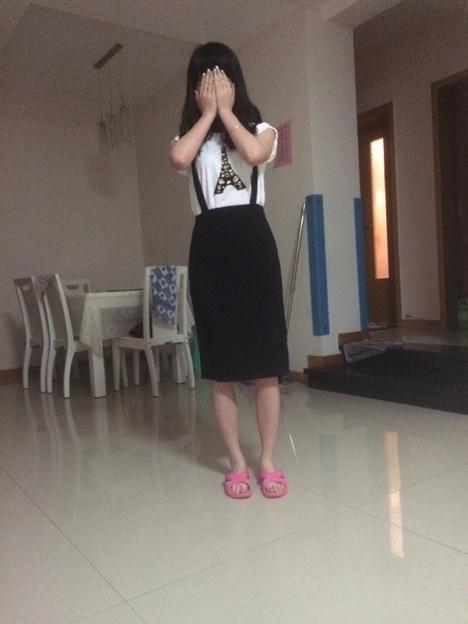

In [0]:
im= cv2.imread('/content/drive/My Drive/deepfashion2/dataset/image/000002.jpg')[:,:,::-1]
cv2_imshow(im[:,:,::-1])

model_final_9243eb.pkl: 144MB [00:13, 10.5MB/s]                           


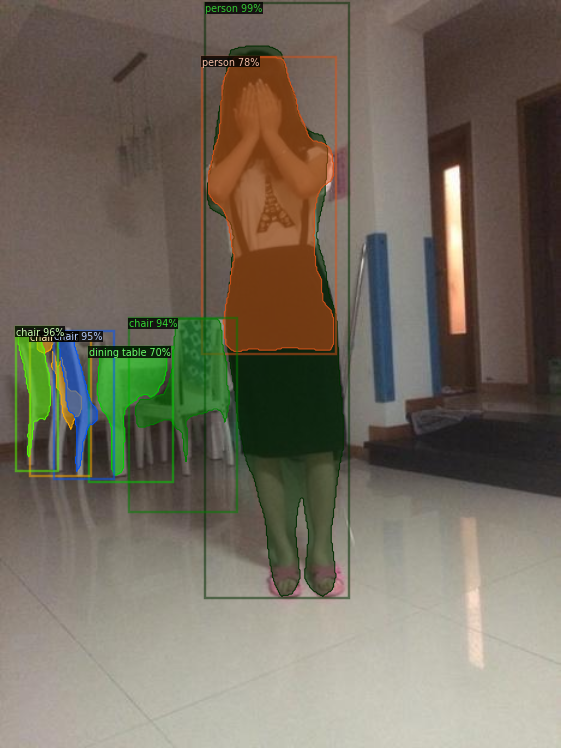

In [0]:
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Inference with a keypoint detection model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml")

cfg.MODEL.DEVICE = "cpu"

predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

Регистрируем новую базу данных:

In [0]:
import os
import numpy as np
import json


from detectron2.data.datasets import register_coco_instances
register_coco_instances("medical_train", {}, "/content/annotation_train.json", "/content/train")
register_coco_instances("medical_test", {}, "/content/annotation_train.json", "/content/train")


In [0]:
from detectron2.data import MetadataCatalog
medical_train_metadata = MetadataCatalog.get("medical_train")
medical_test_metadata = MetadataCatalog.get("medical_test")
medical_train_metadata

Metadata(evaluator_type='coco', image_root='/content/train', json_file='/content/annotation_train.json', name='medical_train')

In [0]:
from detectron2.data import DatasetCatalog
medical_train_dict=DatasetCatalog.get("medical_train")
medical_test_dict=DatasetCatalog.get("medical_test")


Смотрим на загруженные данные:

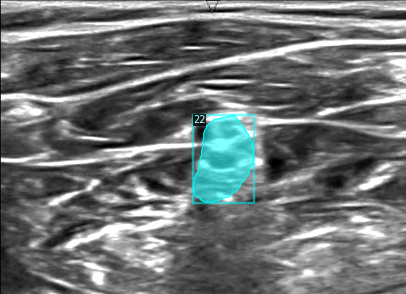

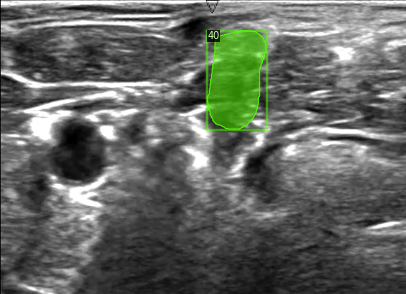

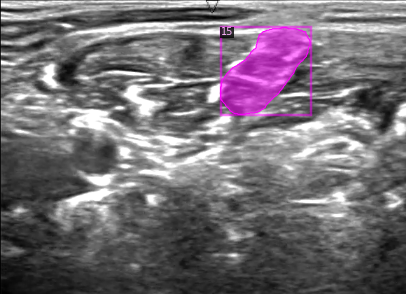

In [0]:
for d in random.sample(medical_train_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("medical_train"), scale=0.7)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Подготавливаем систему к обучению:

In [0]:
from detectron2.engine import SimpleTrainer
from detectron2.config import get_cfg
from detectron2.modeling import build_model
#from detectron2.data import build_transform_gen
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader
    )
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
#from detectron2.data.transforms import (
    #RandomBrightness, RandomContrast, 
    ##RandomSaturation, RandomFlip, RandomCrop, TransformList, 
    #apply_transform_gens)
#from detectron2.data.detection_utils import build_transform_gen
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("medical_train",)
cfg.DATASETS.TEST = ("medical_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_C4_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 15000   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 47  
cfg.OUTPUT_DIR = "/content/output"
cfg.MODEL.DEVICE = "cuda"

#cfg.SOLVER.MOMENTUM = 0.9
#cfg.SOLVER.WEIGHT_DECAY = 0.0001
cfg.SOLVER.GAMMA = 0.1
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"

cfg.SOLVER.WARMUP_ITERS = 3000
cfg.SOLVER.WARMUP_METHOD = "linear"

#cfg.DATASETS.PROPOSAL_FILES_TEST = (2000)
#cfg.INPUT.MAX_SIZE_TRAIN = 896
#cfg.INPUT.MIN_SIZE_TRAIN = (896,)




  #_C.INPUT = CN()
# Size of the smallest side of the image during training
  #_C.INPUT.MIN_SIZE_TRAIN = (800,)
# Sample size of smallest side by choice or random selection from range give by
# INPUT.MIN_SIZE_TRAIN
  #_C.INPUT.MIN_SIZE_TRAIN_SAMPLING = "choice"
# Maximum size of the side of the image during training

# Size of the smallest side of the image during testing. Set to zero to disable resize in testing.
  #_C.INPUT.MIN_SIZE_TEST = 800
# Maximum size of the side of the image during testing
  #_C.INPUT.MAX_SIZE_TEST = 1333
  #__C.TRAIN.SCALES


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
model= build_model(cfg)
optimizer = build_optimizer(cfg, model)
scheduler = build_lr_scheduler(cfg, optimizer)
data_loader = build_detection_train_loader(cfg)

evaluator = detectron2.evaluation.COCOEvaluator("medical_test", cfg, distributed=False, output_dir="/content/output")
val_loader = build_detection_test_loader(cfg, "medical_test")

#DefaultTrainer.test(evaluators=evaluator)

[02/19 17:31:25 d2.data.datasets.coco]: Loaded 2122 images in COCO format from /content/annotation_train.json
[02/19 17:31:25 d2.data.build]: Removed 0 images with no usable annotations. 2122 images left.
[02/19 17:31:25 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[02/19 17:31:25 d2.data.build]: Using training sampler TrainingSampler
[02/19 17:31:25 d2.data.datasets.coco]: Loaded 2122 images in COCO format from /content/annotation_train.json


Обучаем нейросеть:

In [0]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/19 15:30:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

'roi_heads.box_predictor.cls_score.weight' has shape (81, 2048) in the checkpoint but (48, 2048) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (48,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 2048) in the checkpoint but (188, 2048) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (188,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (47, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (47,) in the model! Skipped.


[02/19 15:30:17 d2.engine.train_loop]: Starting training from iteration 0
[02/19 15:30:25 d2.utils.events]:  eta: 1:41:22  iter: 19  total_loss: 4.838  loss_cls: 3.810  loss_box_reg: 0.113  loss_mask: 0.693  loss_rpn_cls: 0.191  loss_rpn_loc: 0.010  time: 0.4051  data_time: 0.0147  lr: 0.000002  max_mem: 3432M
[02/19 15:30:33 d2.utils.events]:  eta: 1:42:08  iter: 39  total_loss: 4.736  loss_cls: 3.664  loss_box_reg: 0.102  loss_mask: 0.694  loss_rpn_cls: 0.227  loss_rpn_loc: 0.012  time: 0.4079  data_time: 0.0053  lr: 0.000003  max_mem: 3432M
[02/19 15:30:42 d2.utils.events]:  eta: 1:43:05  iter: 59  total_loss: 4.566  loss_cls: 3.365  loss_box_reg: 0.133  loss_mask: 0.694  loss_rpn_cls: 0.264  loss_rpn_loc: 0.016  time: 0.4118  data_time: 0.0059  lr: 0.000005  max_mem: 3432M
[02/19 15:30:50 d2.utils.events]:  eta: 1:42:24  iter: 79  total_loss: 4.067  loss_cls: 2.890  loss_box_reg: 0.135  loss_mask: 0.693  loss_rpn_cls: 0.198  loss_rpn_loc: 0.011  time: 0.4089  data_time: 0.0048  lr:

In [0]:
%reload_ext tensorboard
%tensorboard --logdir '/content/output/'

Reusing TensorBoard on port 6006 (pid 1526), started 2:04:34 ago. (Use '!kill 1526' to kill it.)

In [0]:
trainer = DefaultTrainer(cfg)
cfg.MODEL.WEIGHTS = os.path.join("/content/output", "model_final.pth")

trainer.test(cfg, model, evaluators=evaluator)
#inference_on_dataset(trainer.model, val_loader, evaluator)

[02/19 17:35:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

OrderedDict([('bbox',
              {'AP': nan,
               'AP50': nan,
               'AP75': nan,
               'APl': nan,
               'APm': nan,
               'APs': nan}),
             ('segm',
              {'AP': nan,
               'AP50': nan,
               'AP75': nan,
               'APl': nan,
               'APm': nan,
               'APs': nan})])

Смотрим результаты:

In [0]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor


cfg.MODEL.WEIGHTS = os.path.join("/content/output", "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.55   # set the testing threshold for this model

predictor = DefaultPredictor(cfg)

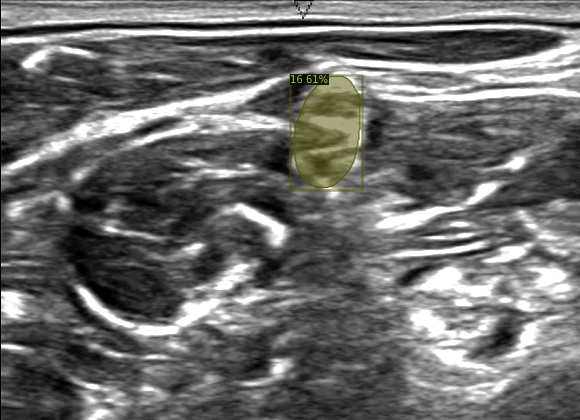

In [0]:
cfg = get_cfg()
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05
im= cv2.imread(os.path.join('/content/test/1001.tif'))

outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get("medical_train"), scale=1)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

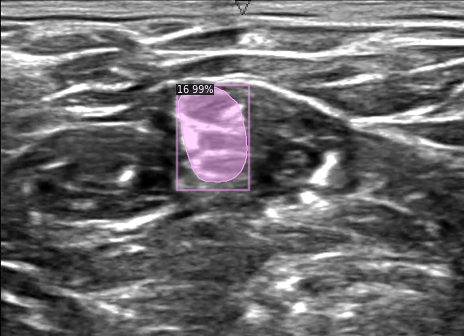

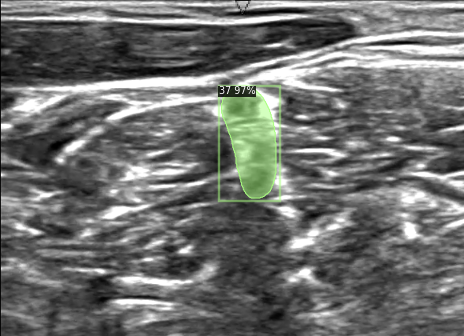

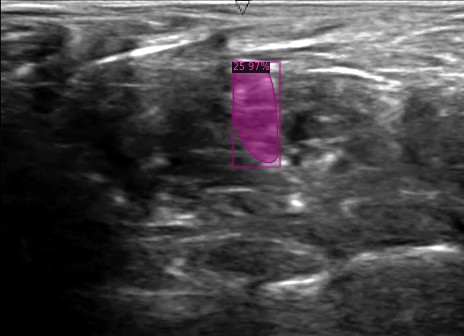

In [0]:
from detectron2.utils.visualizer import ColorMode


for d in random.sample(medical_train_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("medical_test"), 
                   scale=0.8 
                      
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:
#Скопировать веса:
import shutil
shutil.copy ('/content/output/model_final.pth', '/content/drive/My Drive/ultrasound-nerve-segmentation/model_final.pth')

'/content/drive/My Drive/ultrasound-nerve-segmentation/model_final.pth'